# Understanding the Data

### MY2010-2014 Fuel Consumption Ratings 5-cycle.csv

Fuel consumption has implications to climate change and the general environment hence the 
need for accurate prediction and classification of motor vehicles. The dataset can be obtained 
from: https://open.canada.ca/data/en/dataset/98f1a129-f628-4ce4-b24d6f16bf24dd64/resource/80894b62-7b45-4150-946d-ab756814c4b


MODELYEAR e.g. 2014

MAKE e.g. Acura

MODEL e.g. ILX

VEHICLE CLASS e.g. SUV

ENGINE SIZE e.g. 4.7

CYLINDERS e.g 6

TRANSMISSION e.g. A6

FUEL TYPE e.g. z

FUEL CONSUMPTION in CITY(L/100 km) e.g. 9.9

FUEL CONSUMPTION in HWY (L/100 km) e.g. 8.9

FUEL CONSUMPTION COMB (L/100 km) e.g. 9.2

CO2 EMISSIONS (g/km) e.g. 182 --> low --> 0

Understanding the Table

Model 4WD/4X4 = Four-wheel drive

AWD = All-wheel drive

CNG = Compressed natural gas

FFV = Flexible-fuel vehicle

NGV = Natural gas vehicle

*# = High output engine that provides more power than the standard engine of the same size

Transmission A = Automatic

AM = Automated manual

AS = Automatic with select shift

AV = Continuously variable

M = Manual

3 – 10 = Number of gears
Fuel Type X = Regular gasoline

Z = Premium gasoline

D = Diesel

E = Ethanol (E85)

N = Natural Gas

Fuel Consumption City and highway fuel consumption ratings are shown in litres per 100 kilometres (L/100 km) - combined rating (55% city, 45% hwy) is shown in L/100 km and in miles per imperial
gallon (mpg)

CO2 Emissions (g/km) Estimated tailpipe carbon dioxide emissions (in grams per kilometre) are based on fuel type and the combined fuel consumption rating.

The task is to predict the CO2 emission of the vehicles and to classify the vehicles based on the 
categorical variables.

In [1]:
#importing my libraries
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings('ignore')

In [2]:
f_consrating = pd.read_csv('MY2010-2014 Fuel Consumption Ratings 5-cycle.csv')
f_consrating.head()

,MODELYEAR,MAKE,MODEL,VEHICLE CLASS,ENGINE SIZE,CYLINDERS,TRANSMISSION,FUELTYPE,FUEL CONSUMPTION CITY (L/100 km),FUEL CONSUMPTION HWY (L/100 km),FUEL CONSUMPTION COMB (L/100 km),FUEL CONSUMPTION COMB (mpg),CO2EMISSIONS
0,2010,ACURA,CSX,COMPACT,2.0,4,AS5,X,10.9,7.8,9.5,30,219
1,2010,ACURA,CSX,COMPACT,2.0,4,M5,X,10.0,7.6,8.9,32,205
2,2010,ACURA,CSX,COMPACT,2.0,4,M6,Z,11.6,8.1,10.0,28,230
3,2010,ACURA,MDX AWD,SUV,3.7,6,AS6,Z,14.8,11.3,13.2,21,304
4,2010,ACURA,RDX AWD TURBO,SUV,2.3,4,AS5,Z,13.2,10.3,11.9,24,274


In [3]:
f_consrating.columns

Index(['MODELYEAR', 'MAKE', 'MODEL', 'VEHICLE CLASS', 'ENGINE SIZE',
       'CYLINDERS', 'TRANSMISSION', 'FUELTYPE',
       'FUEL CONSUMPTION CITY (L/100 km)', 'FUEL CONSUMPTION HWY (L/100 km)',
       'FUEL CONSUMPTION COMB (L/100 km)', 'FUEL CONSUMPTION COMB (mpg)',
       'CO2EMISSIONS'],
      dtype='object')

In [4]:
f_consrating.columns = f_consrating.columns.str.rstrip().str.replace(' ', '_')

In [5]:
f_consrating.columns

Index(['MODELYEAR', 'MAKE', 'MODEL', 'VEHICLE_CLASS', 'ENGINE_SIZE',
       'CYLINDERS', 'TRANSMISSION', 'FUELTYPE',
       'FUEL_CONSUMPTION_CITY_(L/100_km)', 'FUEL_CONSUMPTION_HWY_(L/100_km)',
       'FUEL_CONSUMPTION_COMB_(L/100_km)', 'FUEL_CONSUMPTION_COMB_(mpg)',
       'CO2EMISSIONS'],
      dtype='object')

In [6]:
f_consrating.head()

,MODELYEAR,MAKE,MODEL,VEHICLE_CLASS,ENGINE_SIZE,CYLINDERS,TRANSMISSION,FUELTYPE,FUEL_CONSUMPTION_CITY_(L/100_km),FUEL_CONSUMPTION_HWY_(L/100_km),FUEL_CONSUMPTION_COMB_(L/100_km),FUEL_CONSUMPTION_COMB_(mpg),CO2EMISSIONS
0,2010,ACURA,CSX,COMPACT,2.0,4,AS5,X,10.9,7.8,9.5,30,219
1,2010,ACURA,CSX,COMPACT,2.0,4,M5,X,10.0,7.6,8.9,32,205
2,2010,ACURA,CSX,COMPACT,2.0,4,M6,Z,11.6,8.1,10.0,28,230
3,2010,ACURA,MDX AWD,SUV,3.7,6,AS6,Z,14.8,11.3,13.2,21,304
4,2010,ACURA,RDX AWD TURBO,SUV,2.3,4,AS5,Z,13.2,10.3,11.9,24,274


In [7]:
f_consrating.shape

(5359, 13)

In [8]:
f_consrating.isna().sum() #checking for null values 

MODELYEAR                           0
MAKE                                0
MODEL                               0
VEHICLE_CLASS                       0
ENGINE_SIZE                         0
CYLINDERS                           0
TRANSMISSION                        0
FUELTYPE                            0
FUEL_CONSUMPTION_CITY_(L/100_km)    0
FUEL_CONSUMPTION_HWY_(L/100_km)     0
FUEL_CONSUMPTION_COMB_(L/100_km)    0
FUEL_CONSUMPTION_COMB_(mpg)         0
CO2EMISSIONS                        0
dtype: int64

In [9]:
# checking for duplicates
f_consrating.duplicated().sum()

0

In [10]:
f_consrating.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5359 entries, 0 to 5358
Data columns (total 13 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   MODELYEAR                         5359 non-null   int64  
 1   MAKE                              5359 non-null   object 
 2   MODEL                             5359 non-null   object 
 3   VEHICLE_CLASS                     5359 non-null   object 
 4   ENGINE_SIZE                       5359 non-null   float64
 5   CYLINDERS                         5359 non-null   int64  
 6   TRANSMISSION                      5359 non-null   object 
 7   FUELTYPE                          5359 non-null   object 
 8   FUEL_CONSUMPTION_CITY_(L/100_km)  5359 non-null   float64
 9   FUEL_CONSUMPTION_HWY_(L/100_km)   5359 non-null   float64
 10  FUEL_CONSUMPTION_COMB_(L/100_km)  5359 non-null   float64
 11  FUEL_CONSUMPTION_COMB_(mpg)       5359 non-null   int64  
 12  CO2EMI

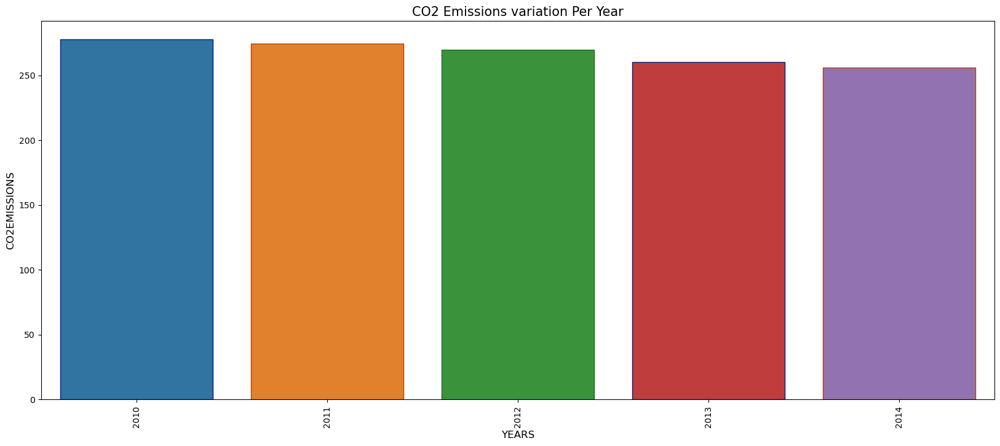

In [11]:
CO2peryear = f_consrating.groupby(['MODELYEAR'])['CO2EMISSIONS'].mean().sort_values().reset_index()

plt.figure(figsize=(20,8))
sns.barplot(x = "MODELYEAR",y="CO2EMISSIONS",data = CO2peryear,
            edgecolor=sns.color_palette("dark", 3))
plt.title('CO2 Emissions variation Per Year', fontsize=15)
plt.xlabel('YEARS', fontsize=12)
plt.xticks(rotation=90, horizontalalignment='center')
plt.ylabel('CO2EMISSIONS', fontsize=12);

In [12]:
#descriptive statistics
f_consrating.describe().round(2)

,MODELYEAR,ENGINE_SIZE,CYLINDERS,FUEL_CONSUMPTION_CITY_(L/100_km),FUEL_CONSUMPTION_HWY_(L/100_km),FUEL_CONSUMPTION_COMB_(L/100_km),FUEL_CONSUMPTION_COMB_(mpg),CO2EMISSIONS
count,5359.00,5359.00,5359.00,5359.00,5359.00,5359.00,5359.00,5359.00
mean,2012.01,3.49,5.96,13.90,9.93,12.12,25.17,267.66
std,1.40,1.39,1.87,4.16,2.81,3.52,6.96,64.32
min,2010.00,1.00,2.00,4.50,4.90,4.70,11.00,108.00
25%,2011.00,2.40,4.00,11.00,8.00,9.70,20.00,221.00
50%,2012.00,3.50,6.00,13.20,9.30,11.40,25.00,260.00
75%,2013.00,4.60,8.00,16.00,11.20,13.90,29.00,305.00
max,2014.00,8.40,16.00,30.40,20.80,26.00,60.00,566.00


## Checking the distribution

<Figure size 1280x960 with 0 Axes>

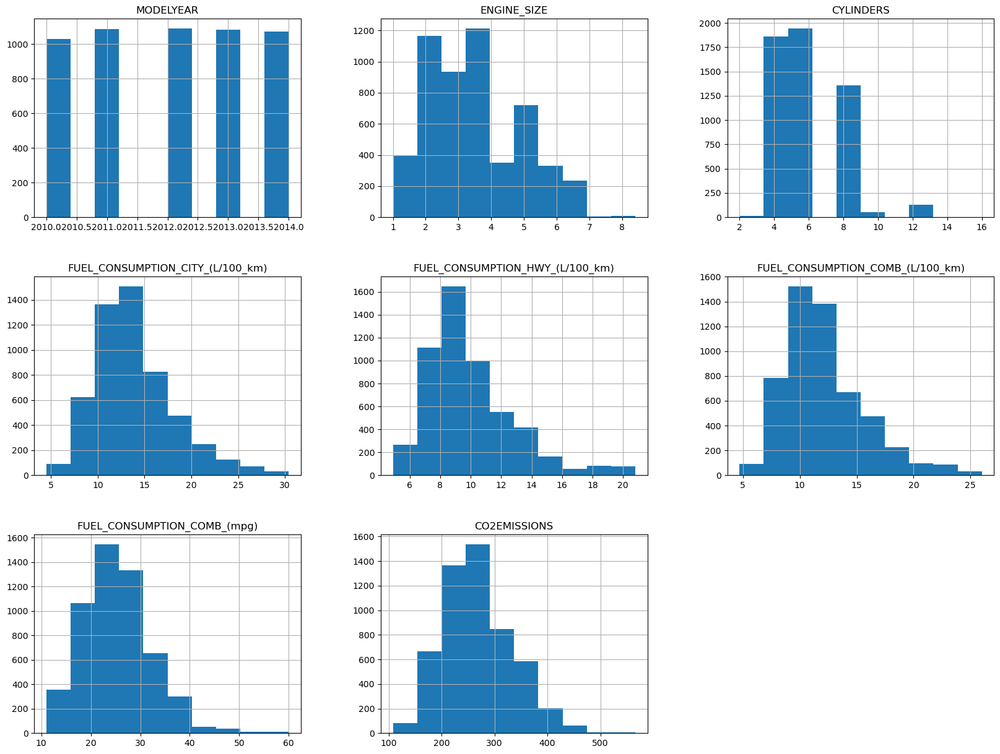

In [13]:
#fig, ax = plt.subplots(nrows=3, ncols=3, sharey = False)
#df.plot(kind = 'hist', subplots = True, sharex = False, sharey = False, figsize=(15,20) )
plt.figure(dpi=200)
f_consrating.hist(figsize = (20,15))
plt.show()
#plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

In [14]:
f_consrating.corr().round(2)

,MODELYEAR,ENGINE_SIZE,CYLINDERS,FUEL_CONSUMPTION_CITY_(L/100_km),FUEL_CONSUMPTION_HWY_(L/100_km),FUEL_CONSUMPTION_COMB_(L/100_km),FUEL_CONSUMPTION_COMB_(mpg),CO2EMISSIONS
MODELYEAR,1.00,-0.06,-0.06,-0.09,-0.10,-0.09,0.13,-0.13
ENGINE_SIZE,-0.06,1.00,0.92,0.82,0.77,0.81,-0.80,0.86
CYLINDERS,-0.06,0.92,1.00,0.78,0.72,0.77,-0.75,0.84
FUEL_CONSUMPTION_CITY_(L/100_km),-0.09,0.82,0.78,1.00,0.97,1.00,-0.93,0.89
FUEL_CONSUMPTION_HWY_(L/100_km),-0.10,0.77,0.72,0.97,1.00,0.99,-0.90,0.86
FUEL_CONSUMPTION_COMB_(L/100_km),-0.09,0.81,0.77,1.00,0.99,1.00,-0.93,0.89
FUEL_CONSUMPTION_COMB_(mpg),0.13,-0.80,-0.75,-0.93,-0.90,-0.93,1.00,-0.90
CO2EMISSIONS,-0.13,0.86,0.84,0.89,0.86,0.89,-0.90,1.00


In [15]:
my_object_f_consrating = f_consrating.select_dtypes(include = 'object') # obtains all the datatypes that are objects
my_object_f_consrating

,MAKE,MODEL,VEHICLE_CLASS,TRANSMISSION,FUELTYPE
0,ACURA,CSX,COMPACT,AS5,X
1,ACURA,CSX,COMPACT,M5,X
2,ACURA,CSX,COMPACT,M6,Z
3,ACURA,MDX AWD,SUV,AS6,Z
4,ACURA,RDX AWD TURBO,SUV,AS5,Z
...,...,...,...,...,...
5354,VOLVO,XC60 AWD,SUV - SMALL,AS6,X
5355,VOLVO,XC60 AWD,SUV - SMALL,AS6,X
5356,VOLVO,XC70 AWD,SUV - SMALL,AS6,X
5357,VOLVO,XC70 AWD,SUV - SMALL,AS6,X


In [16]:
my_numeric_f_consrating = f_consrating.select_dtypes(exclude ='object') # obtains the numerical data type
my_numeric_f_consrating

,MODELYEAR,ENGINE_SIZE,CYLINDERS,FUEL_CONSUMPTION_CITY_(L/100_km),FUEL_CONSUMPTION_HWY_(L/100_km),FUEL_CONSUMPTION_COMB_(L/100_km),FUEL_CONSUMPTION_COMB_(mpg),CO2EMISSIONS
0,2010,2.0,4,10.9,7.8,9.5,30,219
1,2010,2.0,4,10.0,7.6,8.9,32,205
2,2010,2.0,4,11.6,8.1,10.0,28,230
3,2010,3.7,6,14.8,11.3,13.2,21,304
4,2010,2.3,4,13.2,10.3,11.9,24,274
...,...,...,...,...,...,...,...,...
5354,2014,3.0,6,13.4,9.8,11.8,24,271
5355,2014,3.2,6,13.2,9.5,11.5,25,264
5356,2014,3.0,6,13.4,9.8,11.8,24,271
5357,2014,3.2,6,12.9,9.3,11.3,25,260


In [17]:
#Adding model year to categorical dataframe
my_object_f_consrating['MODELYEAR'] = my_numeric_f_consrating['MODELYEAR']
# Remove model year from numerical
my_numeric_f_consrating.drop('MODELYEAR', axis=1, inplace=True)

In [18]:
my_numeric_f_consrating.columns

Index(['ENGINE_SIZE', 'CYLINDERS', 'FUEL_CONSUMPTION_CITY_(L/100_km)',
       'FUEL_CONSUMPTION_HWY_(L/100_km)', 'FUEL_CONSUMPTION_COMB_(L/100_km)',
       'FUEL_CONSUMPTION_COMB_(mpg)', 'CO2EMISSIONS'],
      dtype='object')

In [19]:
# Split data into X and y
X = my_numeric_f_consrating.drop(['CO2EMISSIONS','CYLINDERS','FUEL_CONSUMPTION_CITY_(L/100_km)', 'FUEL_CONSUMPTION_HWY_(L/100_km)', 'FUEL_CONSUMPTION_COMB_(L/100_km)'], axis=1)
y = my_numeric_f_consrating['CO2EMISSIONS']

In [20]:
y

0       219
1       205
2       230
3       304
4       274
       ... 
5354    271
5355    264
5356    271
5357    260
5358    294
Name: CO2EMISSIONS, Length: 5359, dtype: int64

In [21]:
# Train, test and validation split
X_train_full, X_test, y_train_full, y_test = train_test_split(X,y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_full,y_train_full, test_size=0.2, random_state=42)

In [22]:
#Instantiate scaler
mm_scaler = MinMaxScaler()
ss_scaler = StandardScaler()

In [23]:
# Fit and Transform train dataset; Transform on X_test & X_val
X_train = mm_scaler.fit_transform(X_train)
X_test = mm_scaler.transform(X_test)
X_val = mm_scaler.transform(X_val)

In [24]:
#Instantiating the base models
lin = linear_model.LinearRegression()
rf = RandomForestRegressor()
bag = BaggingRegressor()
ext = ExtraTreesRegressor()
dt = DecisionTreeRegressor()

In [25]:
# The model test report
def report_model_test(model):
    model.fit(X_train,y_train)
    basem_preds = model.predict(X_test)
    mean_abs = mean_absolute_error(y_test,basem_preds)
    mean_squared = mean_squared_error(y_test,basem_preds)
    print(f"The result of the mean_absolute_error is: {mean_abs:.2f}")
    print(f"The result of the root mean squared error is : {np.sqrt(mean_squared):.2f}")
    print(f"The result of the coefficient of determination is: {r2_score(y_test,basem_preds):.2f}")

In [26]:
report_model_test(lin)

The result of the mean_absolute_error is: 15.83
The result of the root mean squared error is : 24.21
The result of the coefficient of determination is: 0.86


In [27]:
report_model_test(rf)

The result of the mean_absolute_error is: 4.08
The result of the root mean squared error is : 10.72
The result of the coefficient of determination is: 0.97


In [28]:
report_model_test(bag)

The result of the mean_absolute_error is: 4.10
The result of the root mean squared error is : 10.92
The result of the coefficient of determination is: 0.97


In [29]:
report_model_test(ext)

The result of the mean_absolute_error is: 3.90
The result of the root mean squared error is : 10.41
The result of the coefficient of determination is: 0.97


In [30]:
report_model_test(dt)

The result of the mean_absolute_error is: 4.00
The result of the root mean squared error is : 10.85
The result of the coefficient of determination is: 0.97


In [31]:
params = {
    'max_depth': [10,20,30],
#     'max_features': [2,3,4]
}

CV = GridSearchCV(ext, params)  #run grid search cross validation to choose the best parametesr for the extratreeregressor

In [32]:
CV.fit(X_train, y_train)

GridSearchCV(estimator=ExtraTreesRegressor(),
             param_grid={'max_depth': [10, 20, 30]})

In [33]:
# The model test report
def model_test(model,X, y):
    y_preds = model.predict(X)
    mean_abs = mean_absolute_error(y,y_preds)
    mean_squared = mean_squared_error(y,y_preds)
    print(f"The result of the mean_absolute_error is: {mean_abs:.2f}")
    print(f"The result of the root mean squared error is : {np.sqrt(mean_squared):.2f}")
    print(f"The result of the coefficient of determination is: {r2_score(y,y_preds):.2f}")

In [34]:
CV.best_params_

{'max_depth': 30}

In [35]:
model_test(CV, X_test, y_test)

The result of the mean_absolute_error is: 3.90
The result of the root mean squared error is : 10.40
The result of the coefficient of determination is: 0.97


In [36]:
model_test(CV, X_val, y_val)

The result of the mean_absolute_error is: 4.40
The result of the root mean squared error is : 12.41
The result of the coefficient of determination is: 0.96


In [37]:
feature_importance = CV.best_estimator_.feature_importances_
feature_importance = pd.DataFrame(feature_importance, index=X.columns,columns = ['features']).sort_values('features',ascending=False)

In [38]:
feature_importance

,features
FUEL_CONSUMPTION_COMB_(mpg),0.511583
ENGINE_SIZE,0.488417


In [39]:
f_consrating.head()

,MODELYEAR,MAKE,MODEL,VEHICLE_CLASS,ENGINE_SIZE,CYLINDERS,TRANSMISSION,FUELTYPE,FUEL_CONSUMPTION_CITY_(L/100_km),FUEL_CONSUMPTION_HWY_(L/100_km),FUEL_CONSUMPTION_COMB_(L/100_km),FUEL_CONSUMPTION_COMB_(mpg),CO2EMISSIONS
0,2010,ACURA,CSX,COMPACT,2.0,4,AS5,X,10.9,7.8,9.5,30,219
1,2010,ACURA,CSX,COMPACT,2.0,4,M5,X,10.0,7.6,8.9,32,205
2,2010,ACURA,CSX,COMPACT,2.0,4,M6,Z,11.6,8.1,10.0,28,230
3,2010,ACURA,MDX AWD,SUV,3.7,6,AS6,Z,14.8,11.3,13.2,21,304
4,2010,ACURA,RDX AWD TURBO,SUV,2.3,4,AS5,Z,13.2,10.3,11.9,24,274


In [40]:
def get_y(data, y_):
    X = data.drop(y_, axis=1)
    y = data[y_]
    return X, y

In [41]:
def num_cat_split(data):
    data['MODELYEAR'] = data['MODELYEAR'].astype(str)
    data_num = data.select_dtypes(exclude='object')
    data_cat = data.select_dtypes(include='object')
    return data_num, data_cat

def num_scaling(X_train_num, X_test_num, X_val_num):
    # Fit and Transform train dataset; Transform on X_test & X_val
    X_tra_num = ss_scaler.fit_transform(X_train_num)
    X_tst_num = ss_scaler.transform(X_test_num)
    X_val_num = ss_scaler.transform(X_val_num)
    X_tra_num_df = pd.DataFrame(X_tra_num, columns=X_train_num.columns)
    X_tst_num_df = pd.DataFrame(X_tst_num, columns=X_train_num.columns)
    X_val_num_df = pd.DataFrame(X_val_num, columns=X_train_num.columns)
    return X_tra_num_df, X_tst_num_df, X_val_num_df

def cat_encoding(X_train_cat, X_test_cat, X_val_cat):
    ohe = OneHotEncoder(handle_unknown='ignore')
    X_tr_cat = ohe.fit_transform(X_train_cat).toarray()
    X_tst_cat = ohe.transform(X_test_cat).toarray()
    X_val_cat = ohe.transform(X_val_cat).toarray()
    column_names = ohe.get_feature_names()
    X_tr_cat_df = pd.DataFrame(X_tr_cat, columns=column_names)
    X_tst_cat_df = pd.DataFrame(X_tst_cat, columns=column_names)
    X_val_cat_df = pd.DataFrame(X_val_cat, columns=column_names)
    X_tr_cat_df.reset_index(inplace=True, drop=True)
    X_tst_cat_df.reset_index(inplace=True, drop=True)
    X_val_cat_df.reset_index(inplace=True, drop=True)
    return X_tr_cat_df, X_tst_cat_df, X_val_cat_df

def merge_train_cat(num, cat):
    num_df = pd.concat([num, cat], axis=1)
    return num_df

In [42]:
f_consrating.columns

Index(['MODELYEAR', 'MAKE', 'MODEL', 'VEHICLE_CLASS', 'ENGINE_SIZE',
       'CYLINDERS', 'TRANSMISSION', 'FUELTYPE',
       'FUEL_CONSUMPTION_CITY_(L/100_km)', 'FUEL_CONSUMPTION_HWY_(L/100_km)',
       'FUEL_CONSUMPTION_COMB_(L/100_km)', 'FUEL_CONSUMPTION_COMB_(mpg)',
       'CO2EMISSIONS'],
      dtype='object')

In [43]:
# Dropping highly correlated variables
f_consrating = f_consrating[['MODELYEAR', 'MAKE', 'MODEL', 'VEHICLE_CLASS', 
         'ENGINE_SIZE', 'CYLINDERS', 'TRANSMISSION', 'FUELTYPE',
       'FUEL_CONSUMPTION_CITY_(L/100_km)']]

### FUEL TYPE

In [44]:
f_consrating['FUELTYPE'].value_counts()

X    2663
Z    2125
E     481
D      90
Name: FUELTYPE, dtype: int64

In [45]:
X, y = get_y(f_consrating, 'FUELTYPE')

In [46]:
# Train, test and validation split
X_train_full, X_test, y_train_full, y_test = train_test_split(X,y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_full,y_train_full, test_size=0.2, random_state=42)

In [47]:
f_consrating.columns

Index(['MODELYEAR', 'MAKE', 'MODEL', 'VEHICLE_CLASS', 'ENGINE_SIZE',
       'CYLINDERS', 'TRANSMISSION', 'FUELTYPE',
       'FUEL_CONSUMPTION_CITY_(L/100_km)'],
      dtype='object')

In [48]:
X_train_num, X_train_cat  = num_cat_split(X_train)
X_test_num, X_test_cat  = num_cat_split(X_test)
X_val_num, X_val_cat  = num_cat_split(X_val)

In [49]:
X_train_num, X_test_num, X_val_num =  num_scaling(X_train_num, X_test_num, X_val_num)
X_train_cat, X_test_cat, X_val_cat = cat_encoding(X_train_cat, X_test_cat, X_val_cat)

In [50]:
X_train_df = merge_train_cat(X_train_num, X_train_cat)
X_test_df = merge_train_cat(X_test_num, X_test_cat)
X_val_df = merge_train_cat(X_val_num, X_val_cat)

In [51]:
from imblearn.over_sampling import SMOTE
def data_bal(X, y):
    sm = SMOTE(random_state=42, k_neighbors = 2) # The object is created
    X_res, y_res = sm.fit_resample(X, y) # The object is applied
    X, y = X_res, y_res # reassigning the balanced dataset to X,y
    return X, y
X_train, y_train = data_bal(X_train_df, y_train)

In [52]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import accuracy_score, classification_report

In [53]:
#Instantiating our models
rf = RandomForestClassifier()
ext = ExtraTreesClassifier()
knn = KNeighborsClassifier()

In [54]:
ext.fit(X_train, y_train)
y_pred = ext.predict(X_test_df)
accuracy_score(y_test, y_pred)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           D       1.00      0.53      0.69        19
           E       0.46      0.49      0.47        92
           X       0.88      0.90      0.89       535
           Z       0.96      0.92      0.94       426

    accuracy                           0.87      1072
   macro avg       0.82      0.71      0.75      1072
weighted avg       0.87      0.87      0.87      1072



In [55]:
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test_df)
accuracy_score(y_test, y_pred)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           D       0.37      0.84      0.52        19
           E       0.51      0.96      0.67        92
           X       0.95      0.84      0.89       535
           Z       0.96      0.87      0.91       426

    accuracy                           0.86      1072
   macro avg       0.70      0.88      0.75      1072
weighted avg       0.90      0.86      0.87      1072



In [56]:
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test_df)
accuracy_score(y_test, y_pred)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           D       1.00      0.58      0.73        19
           E       0.81      0.86      0.84        92
           X       0.93      0.96      0.95       535
           Z       0.96      0.93      0.95       426

    accuracy                           0.93      1072
   macro avg       0.93      0.83      0.87      1072
weighted avg       0.94      0.93      0.93      1072



In [57]:
# Validation Test
y_pred_val = rf.predict(X_val_df)
accuracy_score(y_val, y_pred_val)
print(classification_report(y_val, y_pred_val))

              precision    recall  f1-score   support

           D       1.00      0.67      0.80        12
           E       0.87      0.86      0.86        70
           X       0.95      0.98      0.96       424
           Z       0.97      0.93      0.95       352

    accuracy                           0.95       858
   macro avg       0.95      0.86      0.89       858
weighted avg       0.95      0.95      0.95       858



In [58]:
#Feature Importances
feature_importance_n = rf.feature_importances_

In [59]:
feature_importance_df = pd.DataFrame(feature_importance_n, index=X_train.columns,\
                                  columns = ['features']).sort_values('features',ascending=False)

In [60]:
feature_importance_df.round(2).head(10)

,features
FUEL_CONSUMPTION_CITY_(L/100_km),0.18
ENGINE_SIZE,0.08
x1_VOLKSWAGEN,0.04
CYLINDERS,0.04
x3_TWO-SEATER,0.02
x1_BMW,0.02
x4_A6,0.02
x1_CHEVROLET,0.02
x1_MERCEDES-BENZ,0.02
x1_AUDI,0.01


### MODEL

In [61]:
f_consrating['MODEL'].value_counts()

SIERRA 4WD       33
SIERRA           33
SILVERADO        33
SILVERADO 4WD    33
F150 FFV 4X4     26
                 ..
VIPER             1
VIPER GTS         1
M35X              1
M35               1
XK 5.0 COUPE      1
Name: MODEL, Length: 1210, dtype: int64

In [62]:
X, y = get_y(f_consrating, 'MODEL')

In [63]:
# Train, test and validation split
X_train_full, X_test, y_train_full, y_test = train_test_split(X,y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_full,y_train_full, test_size=0.2, random_state=42)

In [64]:
X_train_num, X_train_cat  = num_cat_split(X_train)
X_test_num, X_test_cat  = num_cat_split(X_test)
X_val_num, X_val_cat  = num_cat_split(X_val)

X_train_num, X_test_num, X_val_num =  num_scaling(X_train_num, X_test_num, X_val_num)
X_train_cat, X_test_cat, X_val_cat = cat_encoding(X_train_cat, X_test_cat, X_val_cat)

X_train_f_consrating = merge_train_cat(X_train_num, X_train_cat)
X_test_f_consrating = merge_train_cat(X_test_num, X_test_cat)
X_val_f_consrating = merge_train_cat(X_val_num, X_val_cat)

In [65]:
rf.fit(X_train_f_consrating, y_train)
y_pred = rf.predict(X_test_f_consrating)
accuracy_score(y_test, y_pred)
print(classification_report(y_test, y_pred))

                                        precision    recall  f1-score   support

                      1 SERIES M COUPE       0.00      0.00      0.00         1
                        128i CABRIOLET       0.00      0.00      0.00         0
                            128i COUPE       0.00      0.00      0.00         1
                        135i CABRIOLET       0.00      0.00      0.00         4
                            135i COUPE       0.00      0.00      0.00         2
                  1500 (FuelSaver MDS)       0.00      0.00      0.00         1
                            1500 (MDS)       0.00      0.00      0.00         1
              1500 4X4 (FuelSaver MDS)       0.00      0.00      0.00         2
                        1500 4X4 (MDS)       0.00      0.00      0.00         1
                       1500 4X4 DIESEL       0.00      0.00      0.00         1
                          1500 4X4 FFV       0.00      0.00      0.00         0
                           1500 DIESEL 

## CLUSTERING

In [66]:
from sklearn.metrics import davies_bouldin_score, silhouette_score
from sklearn.cluster import AgglomerativeClustering, KMeans

In [67]:
my_numeric_f_consrating

,ENGINE_SIZE,CYLINDERS,FUEL_CONSUMPTION_CITY_(L/100_km),FUEL_CONSUMPTION_HWY_(L/100_km),FUEL_CONSUMPTION_COMB_(L/100_km),FUEL_CONSUMPTION_COMB_(mpg),CO2EMISSIONS
0,2.0,4,10.9,7.8,9.5,30,219
1,2.0,4,10.0,7.6,8.9,32,205
2,2.0,4,11.6,8.1,10.0,28,230
3,3.7,6,14.8,11.3,13.2,21,304
4,2.3,4,13.2,10.3,11.9,24,274
...,...,...,...,...,...,...,...
5354,3.0,6,13.4,9.8,11.8,24,271
5355,3.2,6,13.2,9.5,11.5,25,264
5356,3.0,6,13.4,9.8,11.8,24,271
5357,3.2,6,12.9,9.3,11.3,25,260


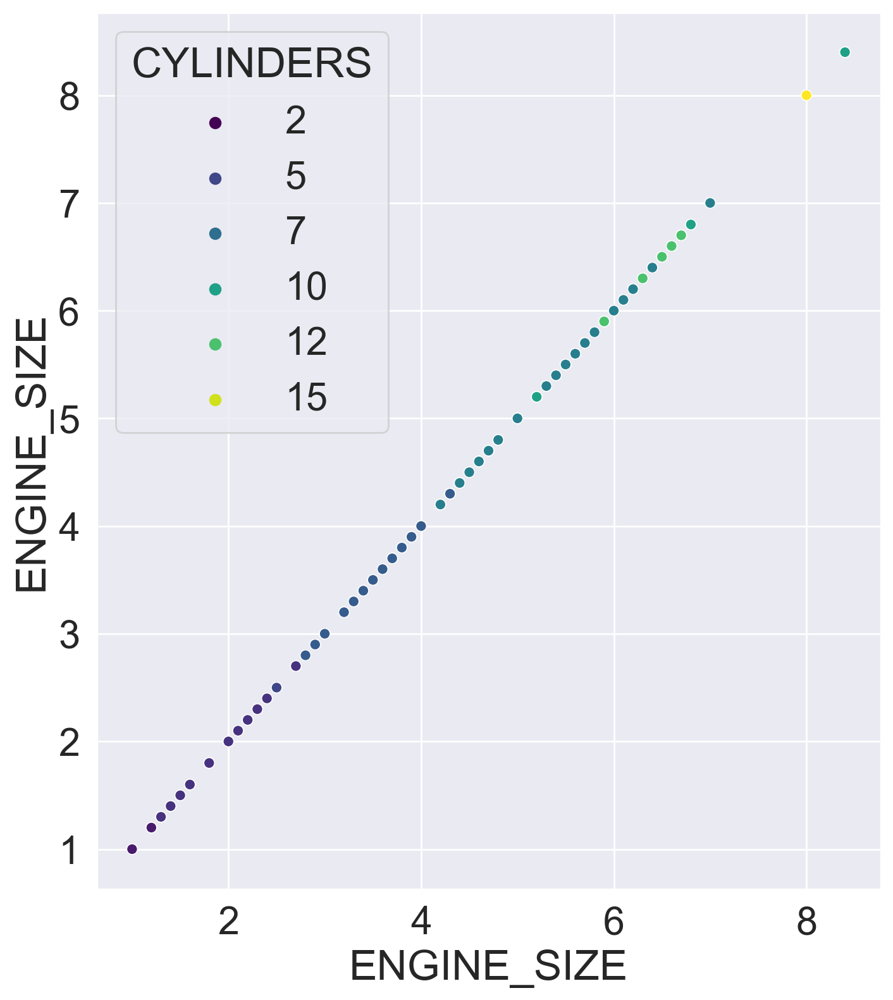

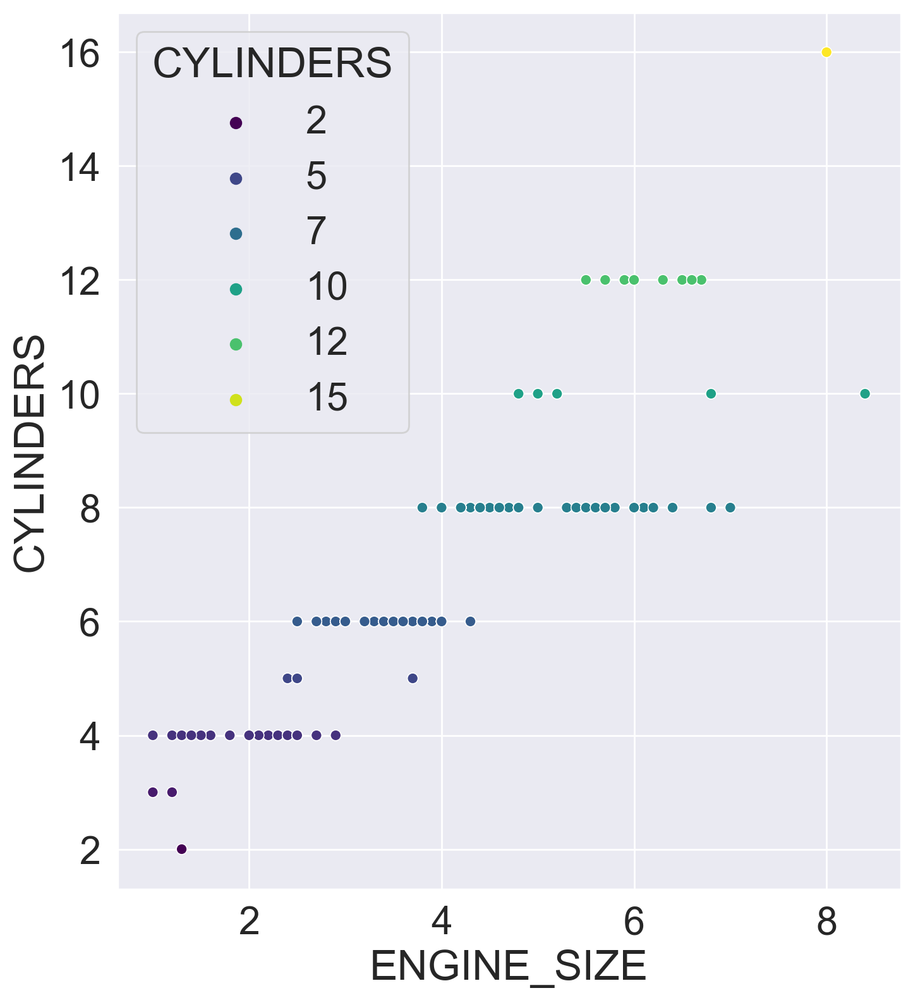

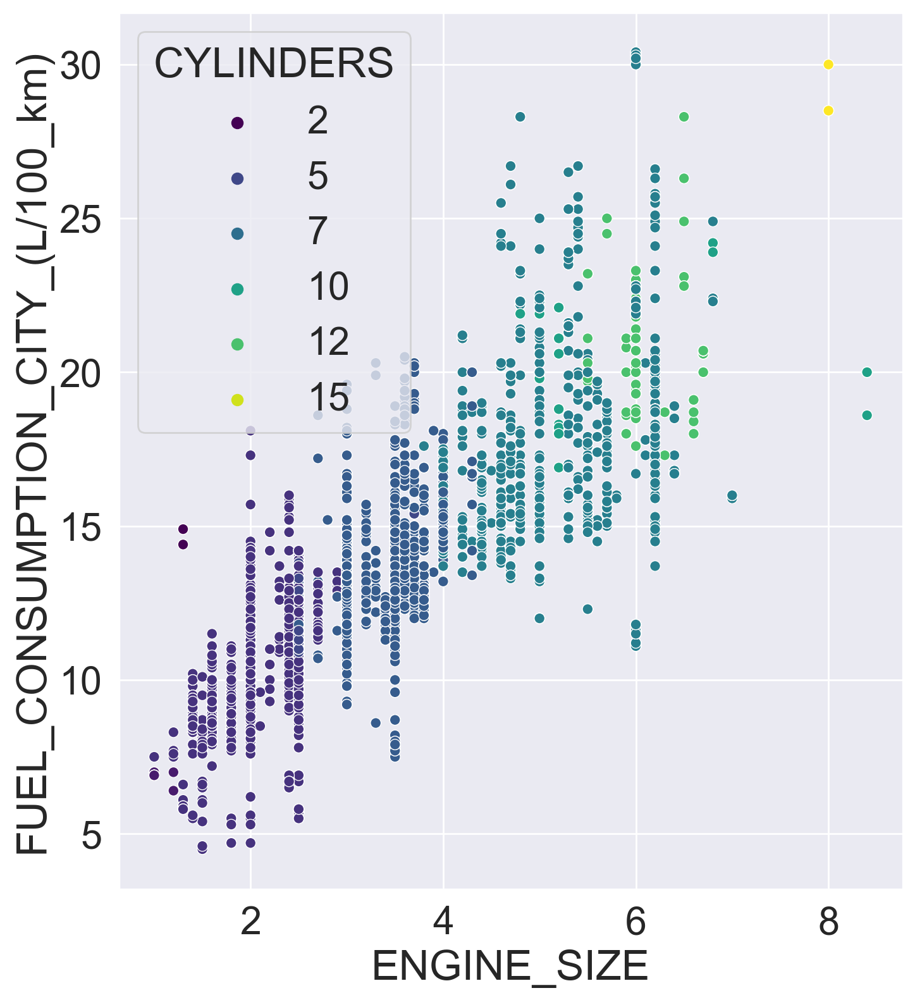

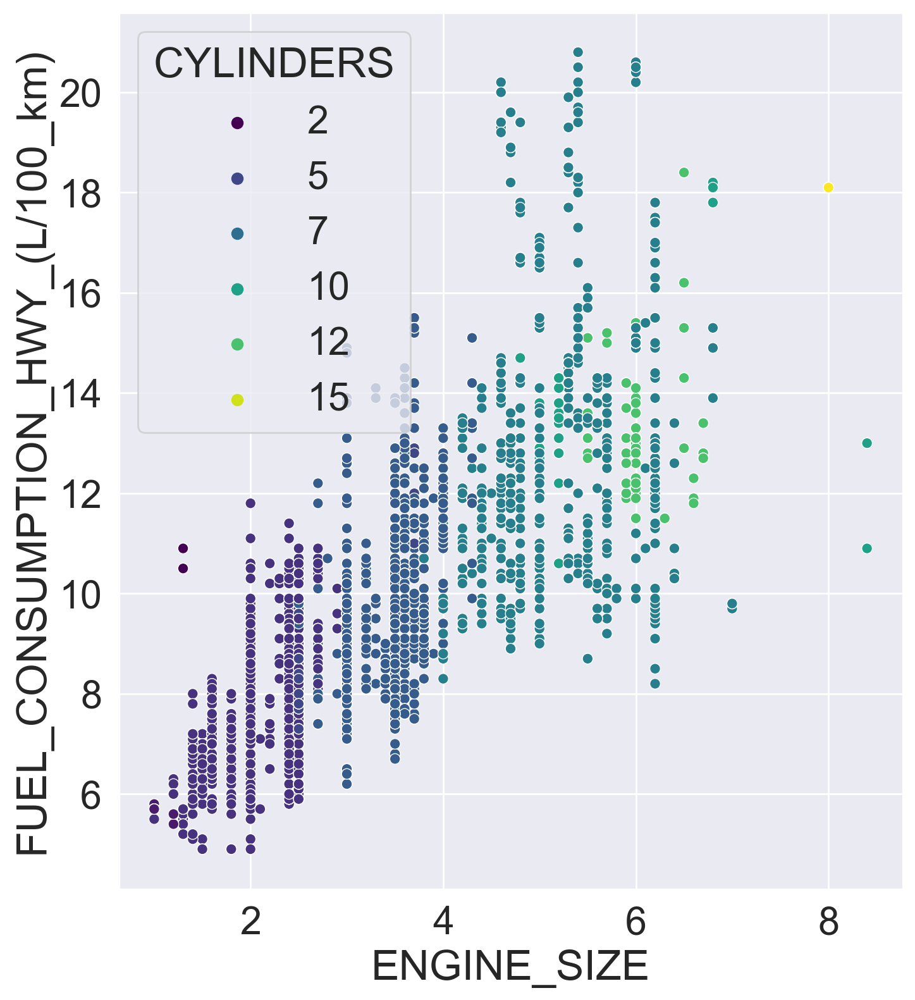

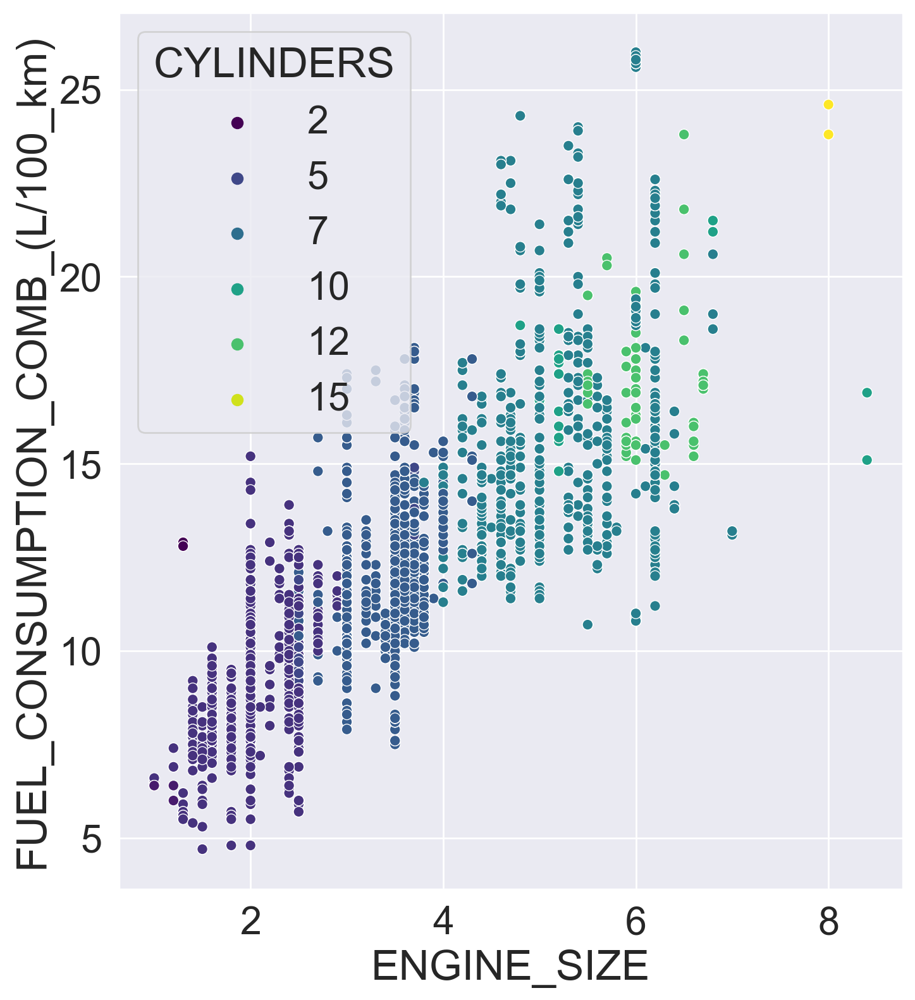

...

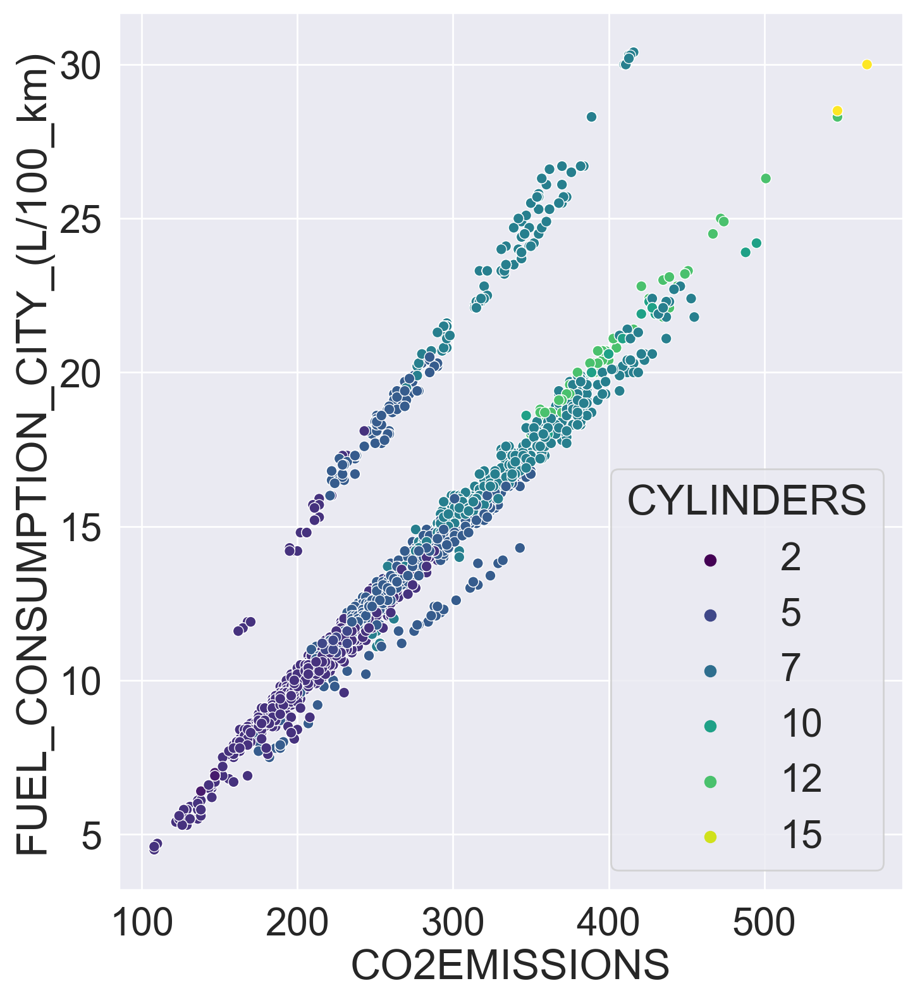

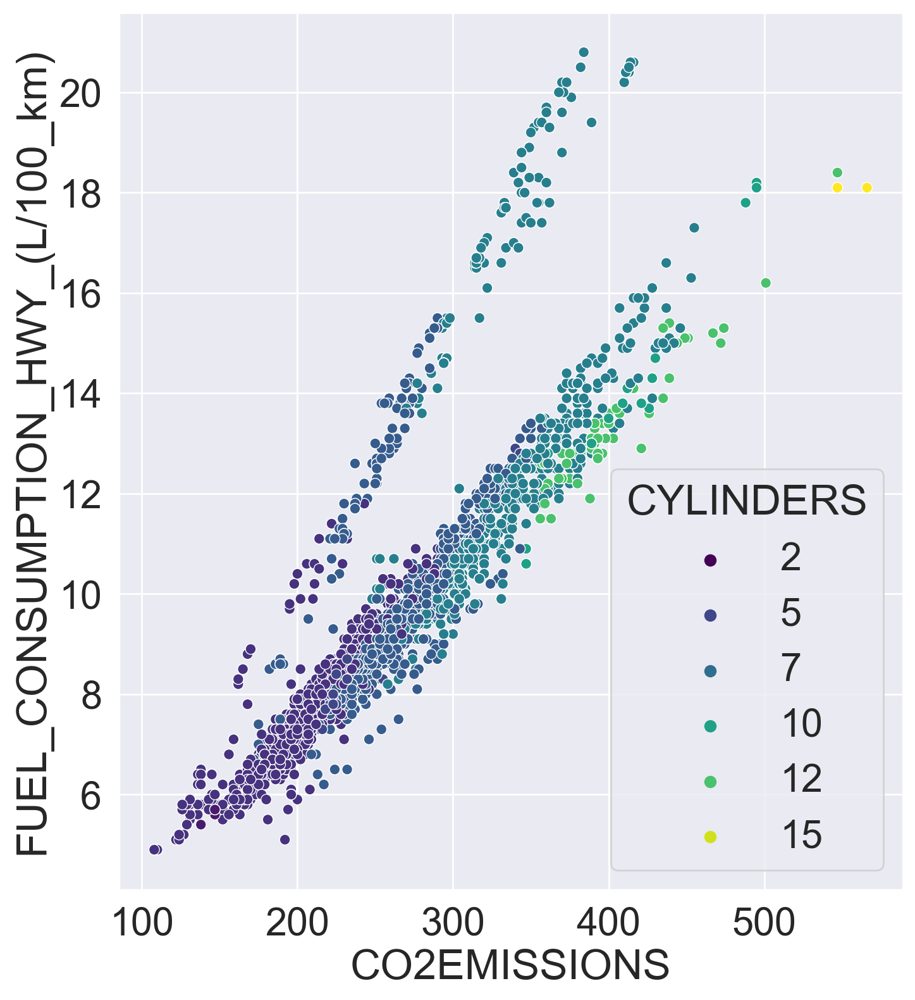

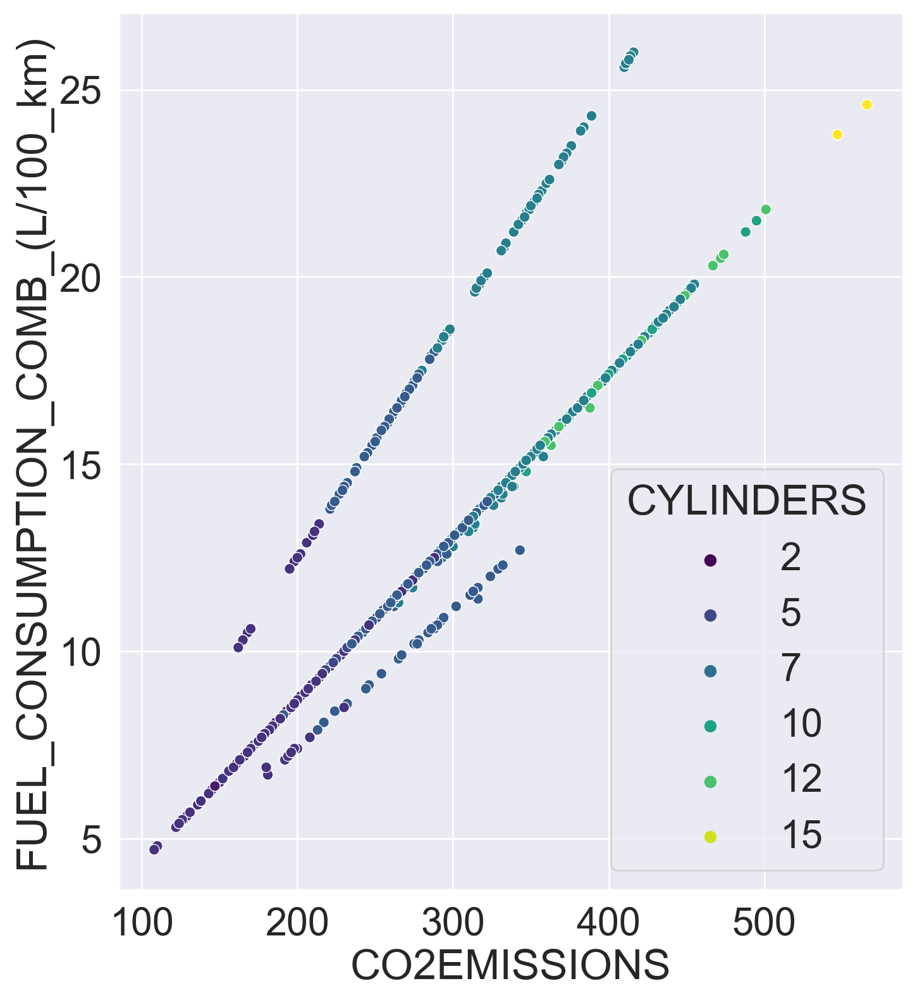

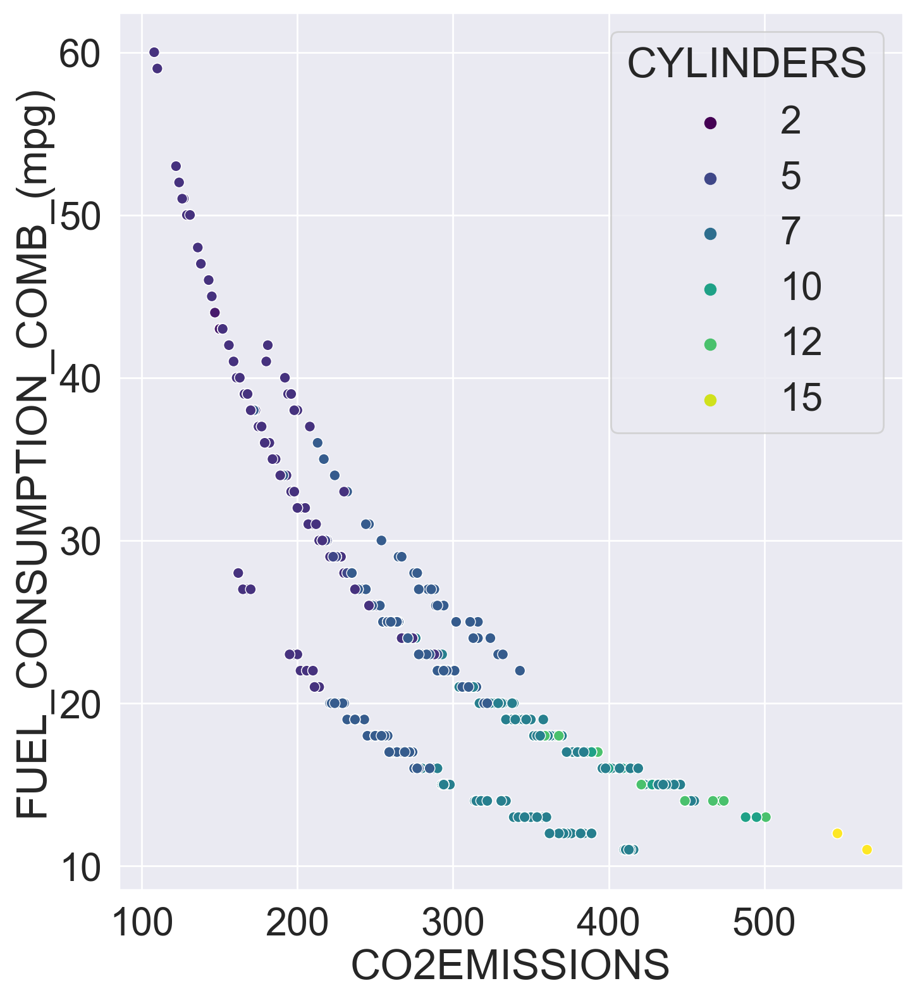

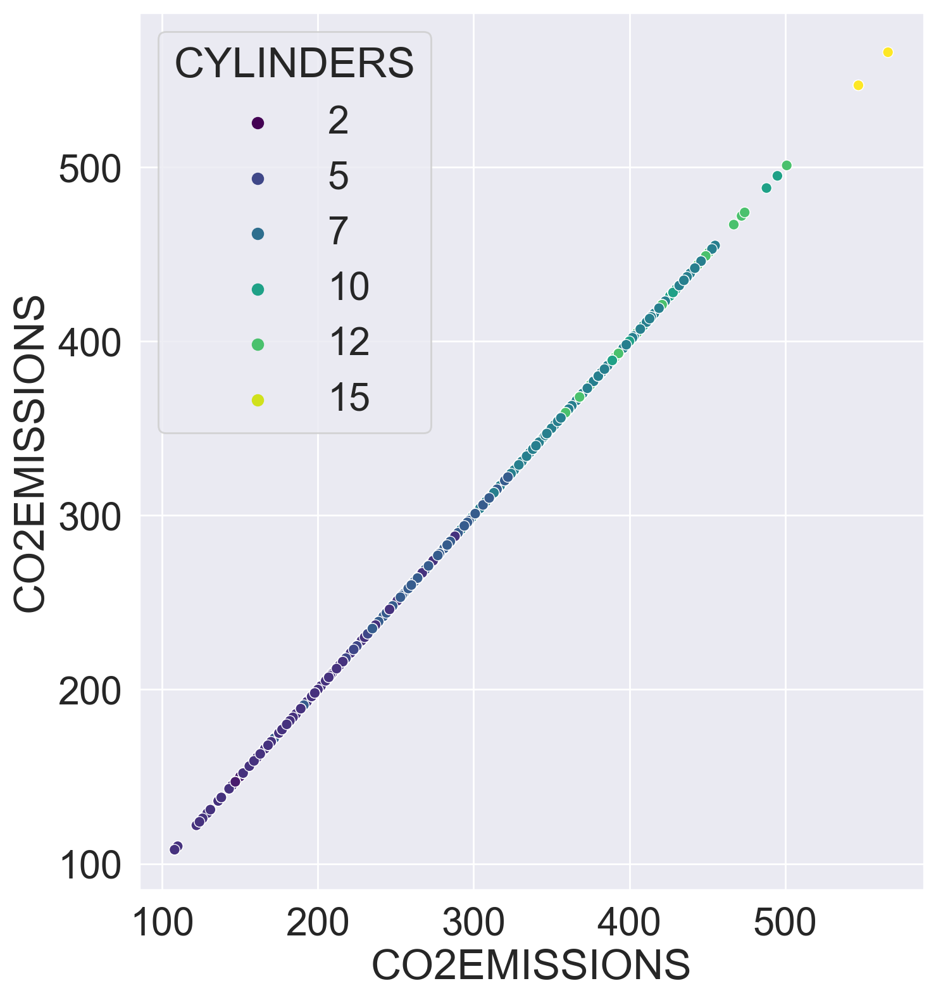

In [68]:
# ploting the attributes to see how they affect the clusters formed
for col1 in my_numeric_f_consrating.columns:
    for col2 in my_numeric_f_consrating.columns:
        plt.figure(figsize = (8,9),dpi = 200)
        sns.set(font_scale=2)
        sns.scatterplot(data = my_numeric_f_consrating, x = my_numeric_f_consrating[col1],y = my_numeric_f_consrating[col2],
                         hue='CYLINDERS', palette = 'viridis')
        plt.show()

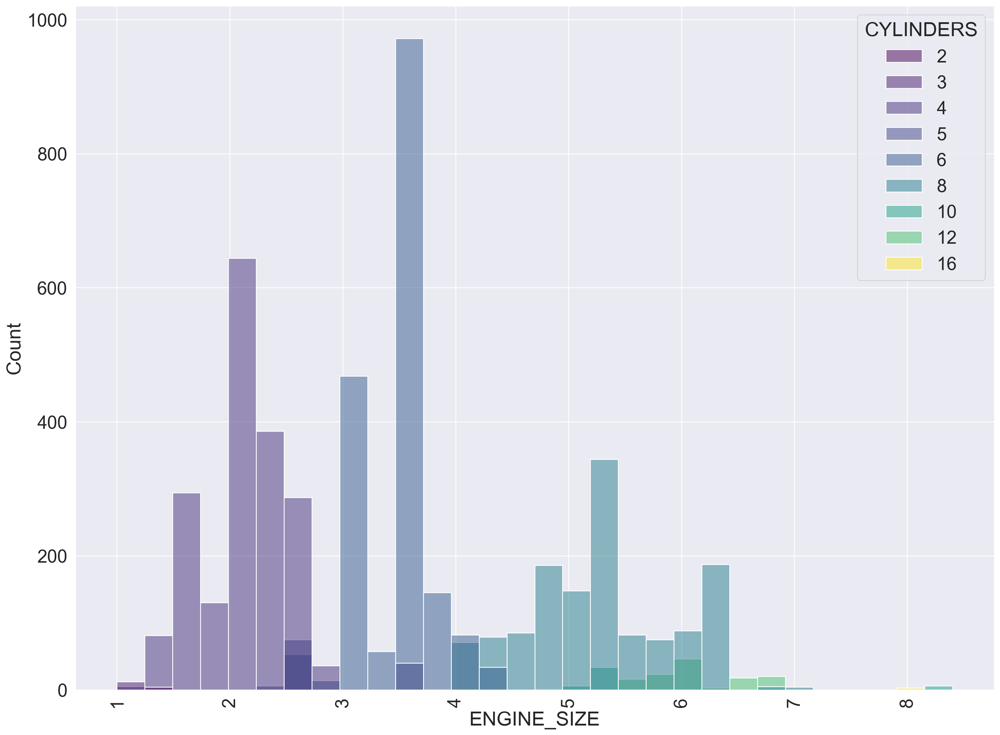

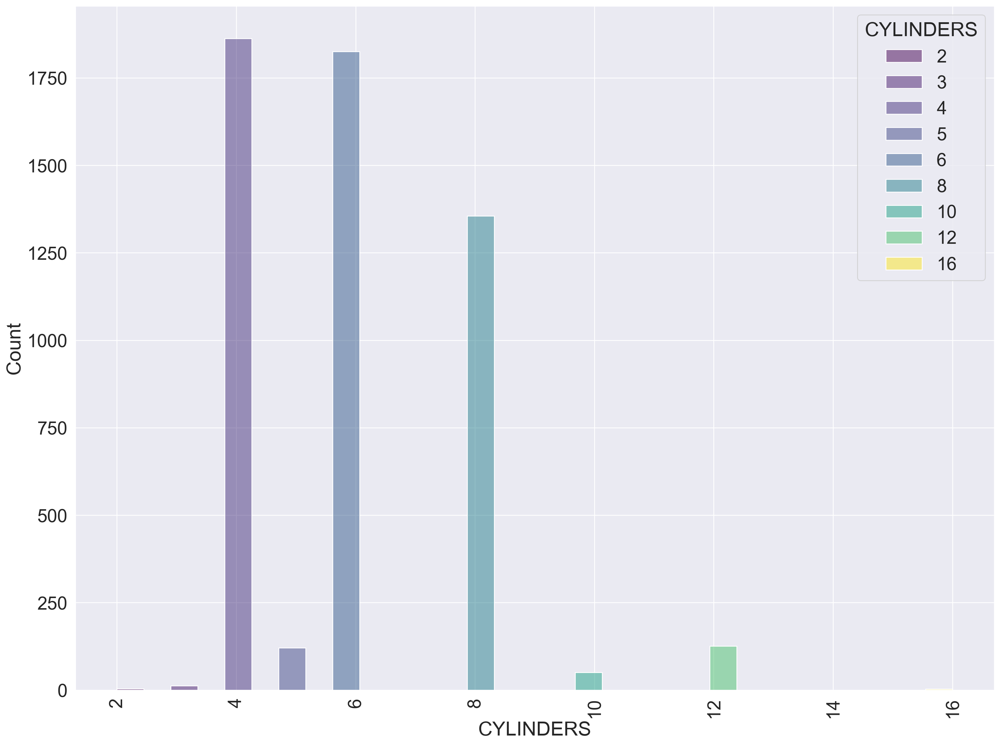

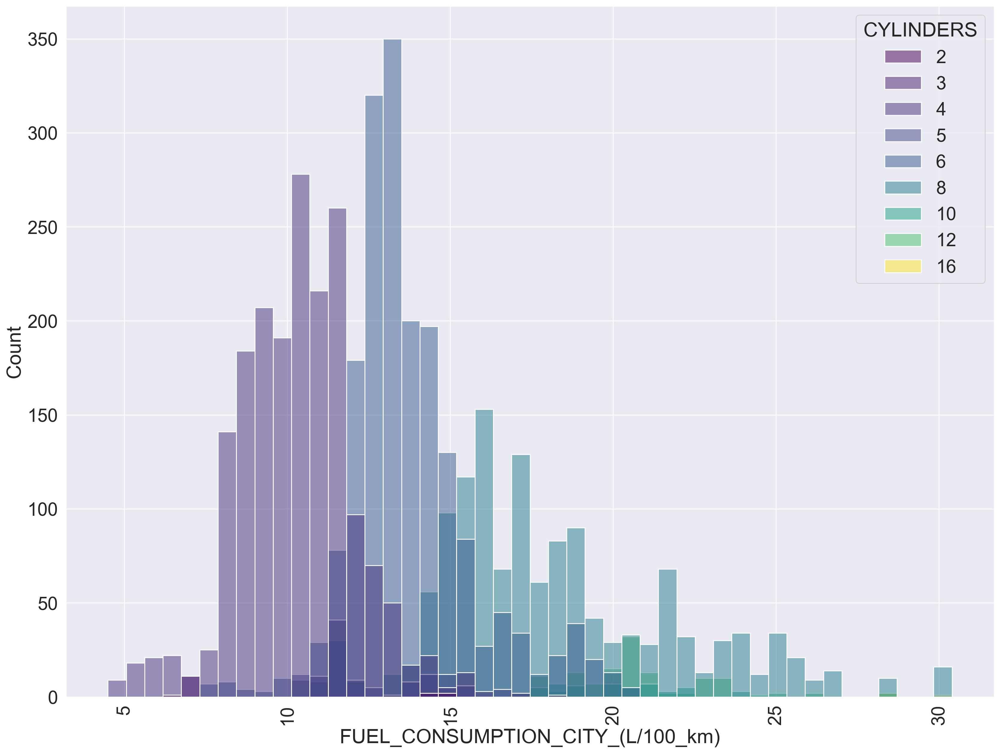

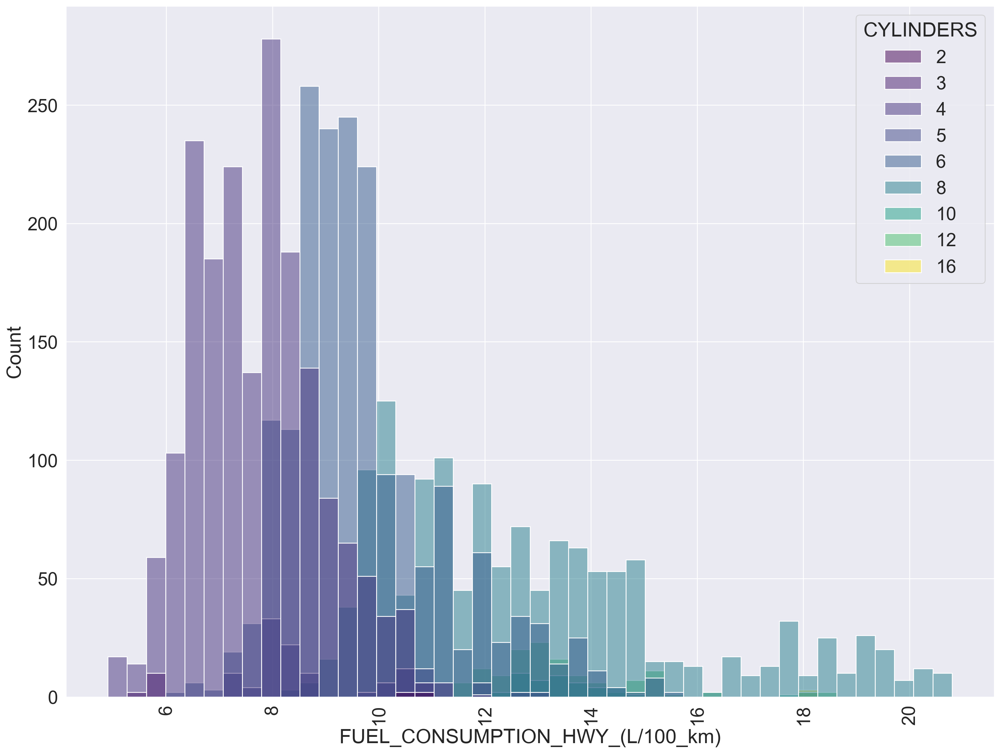

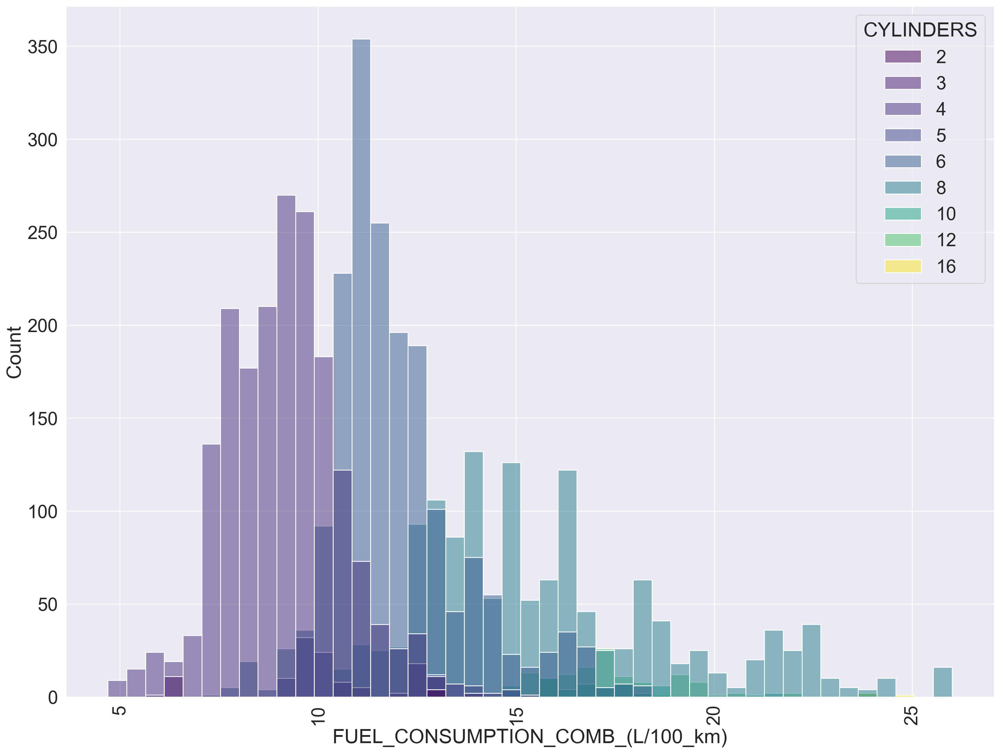

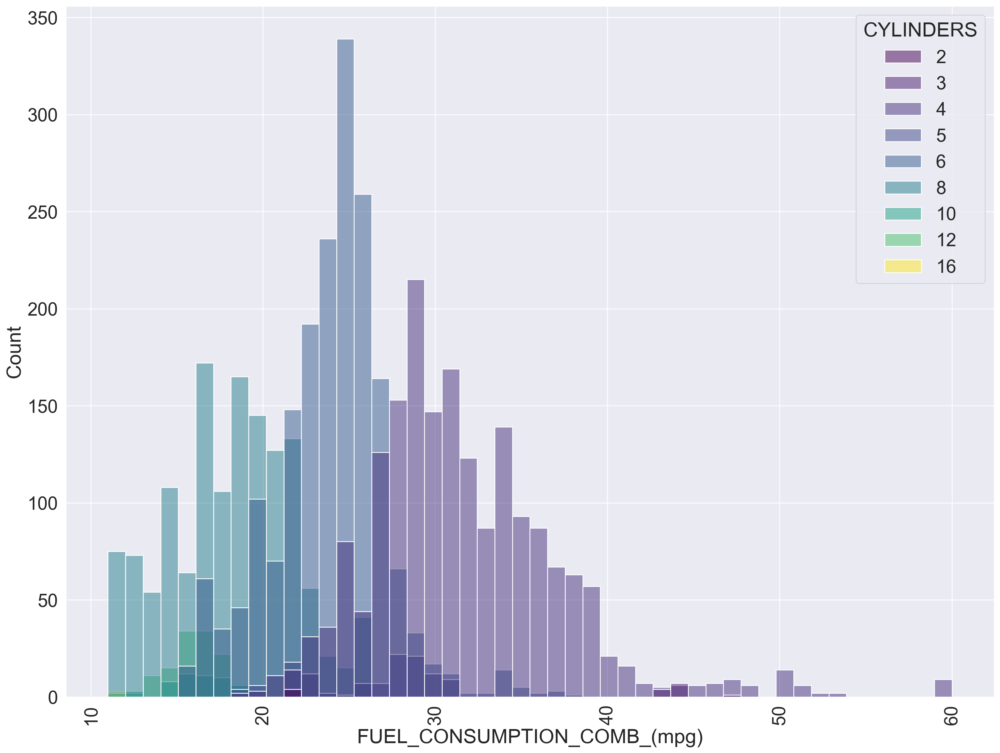

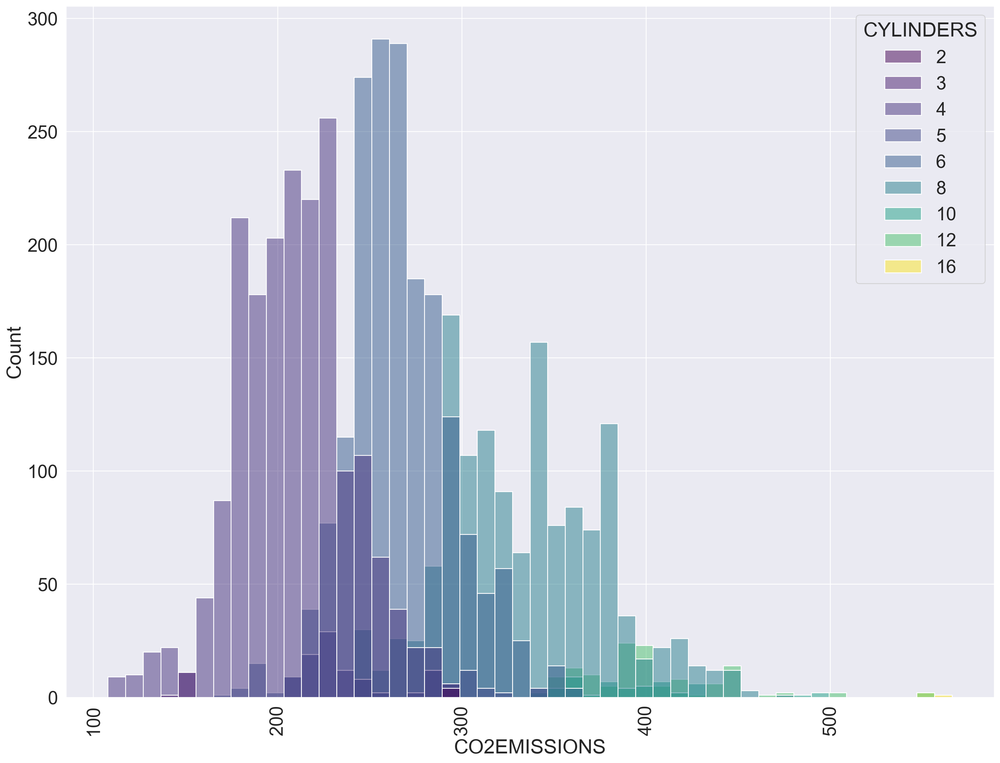

In [69]:
# Plotting the histogram to see their relationship with categories
for col in my_numeric_f_consrating.columns:
    sns.set(font_scale=2)
    plt.figure(figsize=(20,15), dpi = 200)
    sns.histplot(data=my_numeric_f_consrating,x = col, hue = 'CYLINDERS', palette = 'viridis')
    plt.xticks(rotation=90)

## Scaling the data
Since the clustering algorithms used are distance based, it is essential for them to be standardised.

In [70]:
from sklearn.preprocessing import MinMaxScaler # import the MinMaxScaler

In [71]:
scaler_m = MinMaxScaler() # instantiate an object of the MinMaxScaler() class 
scaler_s = StandardScaler() # instantiate an object of the StandardScaler() class

In [72]:
scaled_num_df_s = scaler_s.fit_transform(my_numeric_f_consrating)
scaled_num_df_m = scaler_m.fit_transform(my_numeric_f_consrating)

In [73]:
numeric_f_consrating = pd.DataFrame(scaled_num_df_s, columns = my_numeric_f_consrating.columns)
numeric_f_consrating

,ENGINE_SIZE,CYLINDERS,FUEL_CONSUMPTION_CITY_(L/100_km),FUEL_CONSUMPTION_HWY_(L/100_km),FUEL_CONSUMPTION_COMB_(L/100_km),FUEL_CONSUMPTION_COMB_(mpg),CO2EMISSIONS
0,-1.072672,-1.047770,-0.721356,-0.759621,-0.742474,0.694551,-0.756638
1,-1.072672,-1.047770,-0.937572,-0.830874,-0.912744,0.982082,-0.974330
2,-1.072672,-1.047770,-0.553188,-0.652743,-0.600581,0.407019,-0.585595
3,0.149622,0.020228,0.215579,0.487291,0.307530,-0.599342,0.565063
4,-0.856973,-1.047770,-0.168805,0.131030,-0.061390,-0.168044,0.098580
...,...,...,...,...,...,...,...
5354,-0.353676,0.020228,-0.120757,-0.047100,-0.089769,-0.168044,0.051932
5355,-0.209876,0.020228,-0.168805,-0.153978,-0.174904,-0.024278,-0.056914
5356,-0.353676,0.020228,-0.120757,-0.047100,-0.089769,-0.168044,0.051932
5357,-0.209876,0.020228,-0.240876,-0.225231,-0.231661,-0.024278,-0.119112


## KMeans clustering

In [74]:
from sklearn.cluster import KMeans # import KMeans 

In [75]:
model = KMeans(n_clusters= 4) # assigning the number of clusters to 7

In [76]:
cluster_labels_1 = model.fit_predict(scaled_num_df_s) # fiting and predicting the clusters
cluster_labels_1

array([1, 1, 1, ..., 2, 2, 2])

In [77]:
f_consrating['CLUSTER'] = list(cluster_labels_1)

In [78]:
f_consrating[f_consrating.VEHICLE_CLASS == 'COMPACT'].head(12)

,MODELYEAR,MAKE,MODEL,VEHICLE_CLASS,ENGINE_SIZE,CYLINDERS,TRANSMISSION,FUELTYPE,FUEL_CONSUMPTION_CITY_(L/100_km),CLUSTER
0,2010,ACURA,CSX,COMPACT,2.0,4,AS5,X,10.9,1
1,2010,ACURA,CSX,COMPACT,2.0,4,M5,X,10.0,1
2,2010,ACURA,CSX,COMPACT,2.0,4,M6,Z,11.6,1
9,2010,ACURA,TSX,COMPACT,2.4,4,AS5,Z,11.0,1
10,2010,ACURA,TSX,COMPACT,2.4,4,M6,Z,11.9,2
11,2010,ACURA,TSX,COMPACT,3.5,6,AS5,Z,12.8,2
22,2010,AUDI,A4,COMPACT,2.0,4,AV,Z,10.2,1
24,2010,AUDI,A4 QUATTRO,COMPACT,2.0,4,AS6,Z,11.5,1
25,2010,AUDI,A4 QUATTRO,COMPACT,2.0,4,M6,Z,10.8,1
44,2010,AUDI,S4,COMPACT,3.0,6,AS7,Z,13.6,2


In [79]:
cluster_labels_1

array([1, 1, 1, ..., 2, 2, 2])

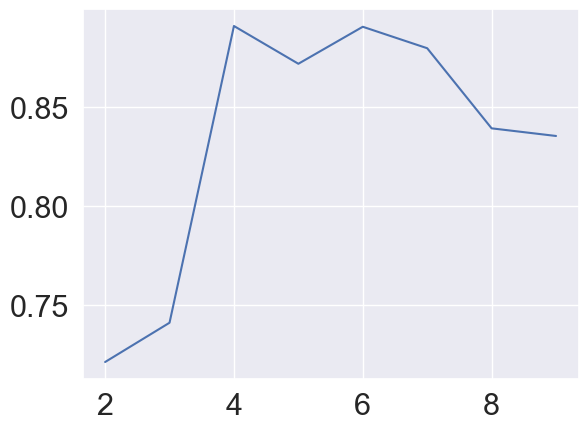

In [80]:
n_cluster = range(2,10)
labels = []
n = []
for k in n_cluster:
    model = KMeans(n_clusters=k)
    cluster_labels_1 = model.fit_predict(scaled_num_df_s)
    DB_index=davies_bouldin_score(scaled_num_df_s,cluster_labels_1)
    labels.append(DB_index)
    n.append(k)
plt.plot(n, labels)
plt.show() 

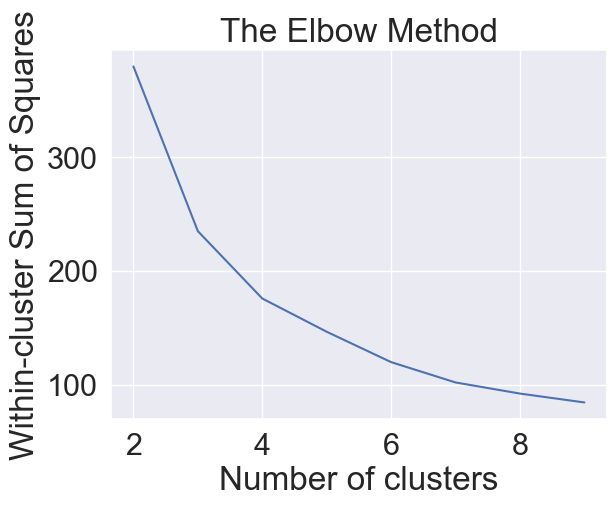

In [96]:
num_cluster = range(2,10)
sum_squared = []
n = []
for k in num_cluster:
    model = KMeans(n_clusters=k, max_iter = 200)
    model.fit(scaled_num_df_m)
    sum_squared.append(model.inertia_)
    n.append(k)
    
plt.plot(n, sum_squared)
plt.title("The Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("Within-cluster Sum of Squares")
plt.show() 

## Clustering evaluation

In [82]:
# the lower the db score, the better the cluster
DB_index=davies_bouldin_score(scaled_num_df_s,cluster_labels_1)
DB_index

0.8353645406185242

In [83]:
# the higher the sil score, the better the cluster
sil_score=silhouette_score(scaled_num_df_s,cluster_labels_1)
sil_score

0.4138293420008325

## Hierarchical clustering

In [84]:
from sklearn.cluster import AgglomerativeClustering #here we import

In [85]:
model = AgglomerativeClustering(n_clusters=5,linkage='single')

In [86]:
cluster_labels_2=model.fit_predict(scaled_num_df_s)
cluster_labels_2

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

## Clustering evaluation

In [87]:
DB_index=davies_bouldin_score(scaled_num_df_s,cluster_labels_2)
DB_index

0.3873568654932858

In [88]:
sil_score=silhouette_score(scaled_num_df_s,cluster_labels_2)
sil_score

0.33824594645312644

## Plotting the dendogram

In [89]:
from sklearn.cluster import AgglomerativeClustering

In [90]:
model = AgglomerativeClustering(n_clusters=None, distance_threshold=0) # distance_threshold=0 means all points

In [91]:
cluster_labels_3=model.fit_predict(scaled_num_df_s)
cluster_labels_3

array([5358, 5357, 5356, ...,    1,    2,    0], dtype=int64)

In [92]:
from scipy.cluster import hierarchy # scipy is used for plotting the hierarchy
from scipy.cluster.hierarchy import dendrogram

In [93]:
matrix_linkage = hierarchy.linkage(model.children_) # hierarchy is used to obtain the children
matrix_linkage # distances between the points 

array([[0.00000000e+00, 1.00000000e+00, 1.41421356e+00, 2.00000000e+00],
       [3.00000000e+00, 4.00000000e+00, 1.41421356e+00, 2.00000000e+00],
       [1.10000000e+01, 1.20000000e+01, 1.41421356e+00, 2.00000000e+00],
       ...,
       [8.30400000e+03, 1.07110000e+04, 4.18294155e+02, 5.35600000e+03],
       [5.16400000e+03, 1.07120000e+04, 4.51886048e+02, 5.35700000e+03],
       [4.87400000e+03, 1.07130000e+04, 5.01806736e+02, 5.35800000e+03]])

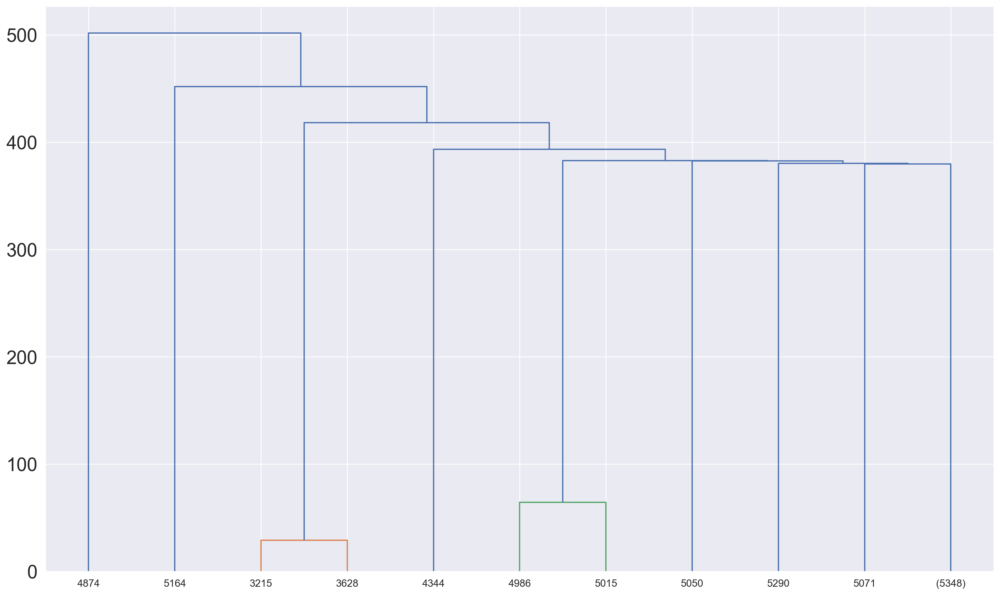

In [94]:
plt.figure(figsize=(20,12), dpi = 200,)
dendrogram(Z=matrix_linkage,truncate_mode= 'level', p= 7);